In [ ]:
! pip install rembg
! pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 648.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.1 MB/s eta 0:00:00


In [ ]:
import numpy as np
import random
import os
import torch
from diffusers import StableDiffusionPipeline, AutoencoderTiny, DDIMScheduler
from diffusers.utils import load_image
from peft import PeftModel, LoraConfig
from rembg import remove
from diffusers.utils import make_image_grid
import time
from tqdm import tqdm

from google.colab import drive
drive.mount('/content/drive')


model_id_default = "stable-diffusion-v1-5/stable-diffusion-v1-5"
device = "cuda" if torch.cuda.is_available() else "cpu"
seed_default = 7

if torch.cuda.is_available():
    torch_dtype = torch.float16
else:
    torch_dtype = torch.float32

params_default = {'prompt': 'Sticker of funny_cat Pusheen wearing a red scarf.',
                  'negative_prompt': 'bad quality, artifacts, low-res',
                  'guidance_scale': 7.0,
                  'num_inference_steps': 50,
                  'width': 512,
                  'height': 512,
                  'generator': torch.Generator(device).manual_seed(seed_default)
                  }

def make_pipe(
    model_id=model_id_default,
    ckpt_dir='/content/drive/My Drive/Colab_Notebooks/Diffusion/model_output/',
    lora_scale=1.0
):

    unet_sub_dir = os.path.join(ckpt_dir, "unet")
    text_encoder_sub_dir = os.path.join(ckpt_dir, "text_encoder")
    pipe = StableDiffusionPipeline.from_pretrained(model_id,
                                                    torch_dtype=torch_dtype,
                                                    safety_checker=None).to(device)
    pipe.unet = PeftModel.from_pretrained(pipe.unet, unet_sub_dir)
    pipe.text_encoder = PeftModel.from_pretrained(pipe.text_encoder, text_encoder_sub_dir)

    pipe.unet.load_state_dict({k: lora_scale*v for k, v in pipe.unet.state_dict().items()})
    pipe.text_encoder.load_state_dict({k: lora_scale*v for k, v in pipe.text_encoder.state_dict().items()})

    if torch_dtype in (torch.float16, torch.bfloat16):
        pipe.unet.half()
        pipe.text_encoder.half()

    pipe.to(device)

    return pipe

def pipe_size(pipe):
    return sum(p.numel() for p in pipe.unet.parameters()), sum(p.numel() for p in pipe.text_encoder.parameters()), sum(p.numel() for p in pipe.vae.parameters())

# Часть 1: знакомство с rembg, обрезаем фон

Загружаем модель, генерируем тестовую картинку

In [ ]:
pipe = make_pipe()
img = pipe(**params_default).images[0]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

Описание параметров функции remove (https://github.com/danielgatis/rembg/blob/main/USAGE.md):
* (не использую в ноутбуке) **session**: позволяет использовать определённую модель для обработки изображений.
* **alpha_matting**: bool=False, логический параметр, включающий или отключающий использование альфа-маттирования (специальной постобработки) для улучшения качества результата.
* **alpha_matting_foreground_threshold**: int=240, определяет порог для пикселей переднего плана при альфа-маттировании. Пиксели с яркостью выше этого значения считаются частью переднего плана.
* **alpha_matting_background_threshold**: int=10, определяет порог для пикселей фона при альфа-маттировании. Пиксели с яркостью ниже этого значения считаются частью фона.
* **alpha_matting_erode_size**: int=10, задает размер эрозии для маски при альфа-маттировании. Увеличивает точность выделения краев объектов.
* **only_mask**: bool=False, если True, возвращает только маску (черно-белое изображение), где белый цвет — это передний план, а черный — фон.
* **post_process_mask**: bool=False, включает постобработку маски для улучшения результатов.
* **bgcolor**: Optional[Tuple[int, int, int, int]]=None, позволяет задать цвет фона в формате RGBA. Если None, фон будет прозрачным. Пример: (255, 255, 255, 255) — белый фон.
* (не использую в ноутбуке) **force_return_bytes**: bool=False, если True, возвращает результат в виде байтовой строки.

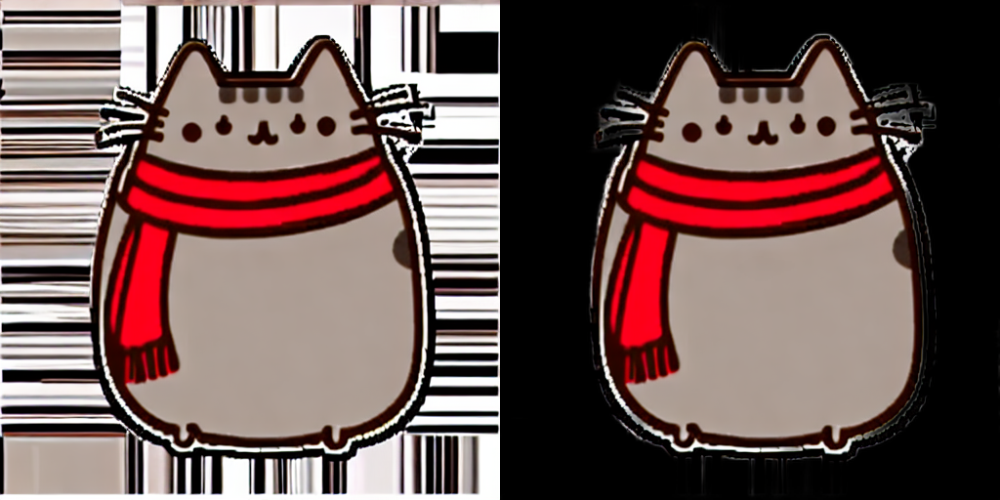

In [ ]:
make_image_grid([img,
                 remove(img)], rows=1, cols=2)

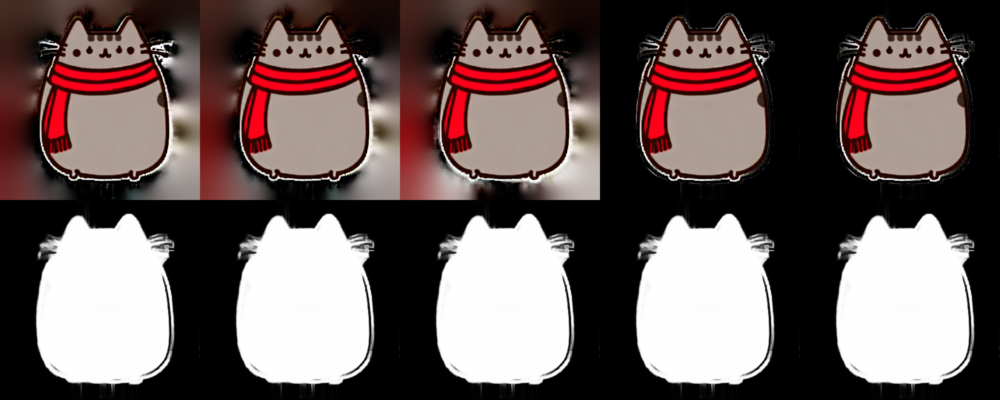

In [ ]:
make_image_grid([remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=240),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=250),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=270),

                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=240, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=250, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=270, only_mask=True)
                ], rows=2, cols=5)

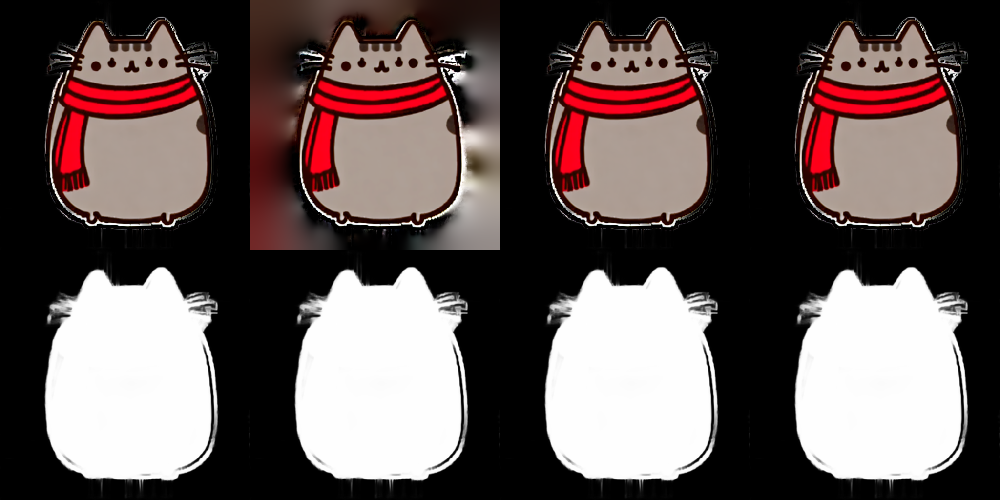

In [ ]:
make_image_grid([remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=20),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=20),

                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=20, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=20, only_mask=True)
                ], rows=2, cols=4)

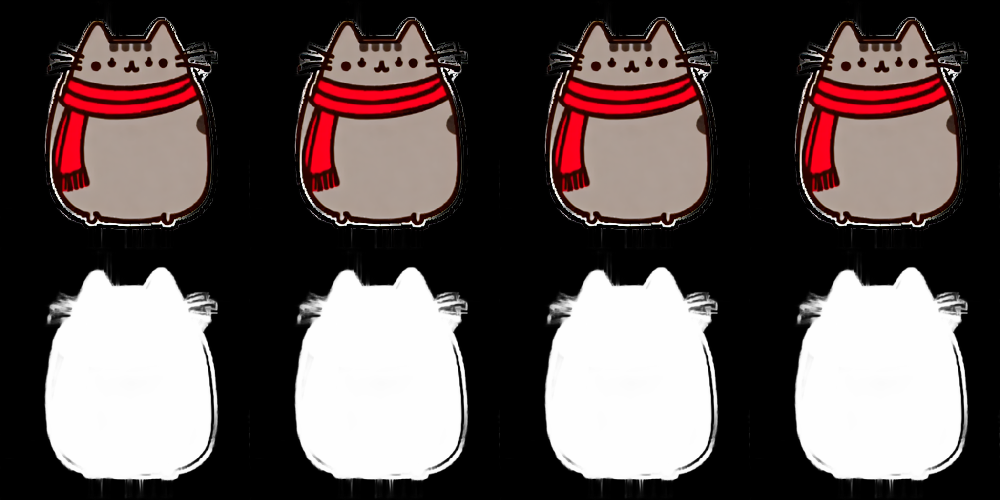

In [ ]:
make_image_grid([remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0, alpha_matting_erode_size=0),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0, alpha_matting_erode_size=20),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=0),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20),

                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0, alpha_matting_erode_size=0, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=140, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=0, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, only_mask=True)
                ], rows=2, cols=4)

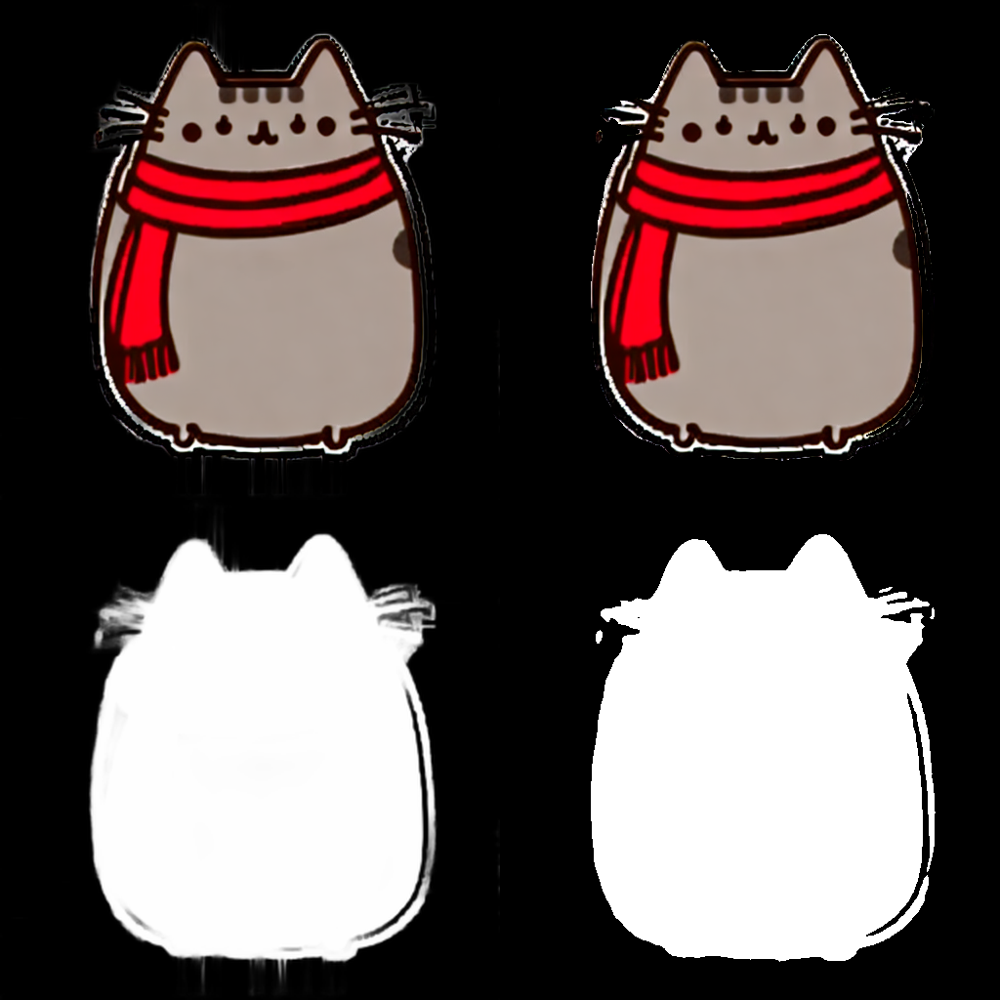

In [ ]:
make_image_grid([remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, post_process_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, only_mask=True),
                 remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, post_process_mask=True, only_mask=True)
                ], rows=2, cols=2)

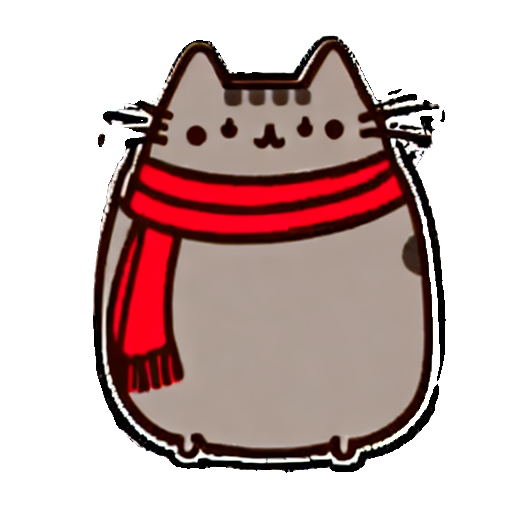

In [ ]:
remove(img, alpha_matting=True, alpha_matting_foreground_threshold=260, alpha_matting_background_threshold=0, alpha_matting_erode_size=20, post_process_mask=True, bgcolor=(255, 255, 255, 255))

# Часть 2: ускорение модели

В пунктах 2.1 -- 2.3 смотрю на картинки при инференсе ускоренных моделей, в пункте 2.4 сравниваю скорость методов и кол-во параметров.

### 2.1 Дистиллированные версии

Расмотрела 2 дистиллированные Stable Diffusion Models:
1. nota-ai/bk-sdm-v2-base
2. nota-ai/bk-sdm-v2-small

Поскольку к ним нельзя подключить обученную ранее для SD 1.5 LoRA, а сравнить работу моделей хочется именно на выбранных мною стикерах, я дообучила LoRA адаптеры для дистиллированных версий по тому же алгоритму и с теми же параметрами, что и для SD 1.5. Ноутбуки дообучения для дистиллированных версий не отличались от нотбука для SD 1.5 (сдан в ДЗ_5). Пример для small версии: https://drive.google.com/file/d/1bPArMjfua74pR9VvjUqLCI_XhiStYqdT/view?usp=sharing.


In [ ]:
# базовая модель SD 1.5
model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"
pipe = make_pipe()

# дистиллированная модель nota-ai/bk-sdm-v2-base
model_id = 'nota-ai/bk-sdm-v2-base'
pipe_d1 = make_pipe(model_id=model_id,
                    ckpt_dir='/content/drive/My Drive/Colab_Notebooks/Diffusion/model_output_distilled_base/')

# дистиллированная модель nota-ai/bk-sdm-v2-small
model_id = 'nota-ai/bk-sdm-v2-small'
pipe_d2 = make_pipe(model_id=model_id,
                    ckpt_dir='/content/drive/My Drive/Colab_Notebooks/Diffusion/model_output_distilled_small/')

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/peft/config.py:162: UserWarning: Unexpected keyword arguments ['corda_config', 'trainable_token_indices'] for class LoraConfig, these are ignored. This probably means that you're loading a configuration file that was saved using a higher version of the library and additional parameters have been introduced since. It is highly recommended to upgrade the PEFT version before continuing (e.g. by running `pip install -U peft`).
  warnings.warn(


model_index.json:   0%|          | 0.00/538 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/755 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/1.48k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.94G [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/599 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

PROMPT: Sticker of funny_cat Pusheen wearing a red scarf. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

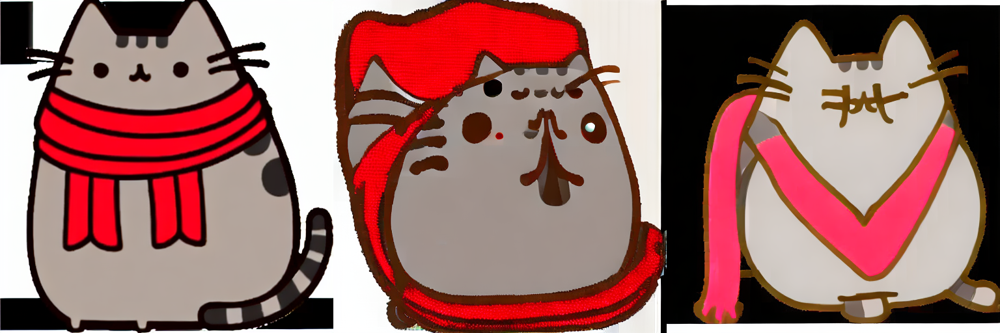

In [ ]:
print('PROMPT:', params_default['prompt'], '\n')

make_image_grid([pipe(**params_default).images[0],
                 pipe_d1(**params_default).images[0],
                 pipe_d2(**params_default).images[0]], rows=1, cols=3)

PROMPT: Sticker of funny_cat Pusheen eating cookies and drinking milk. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

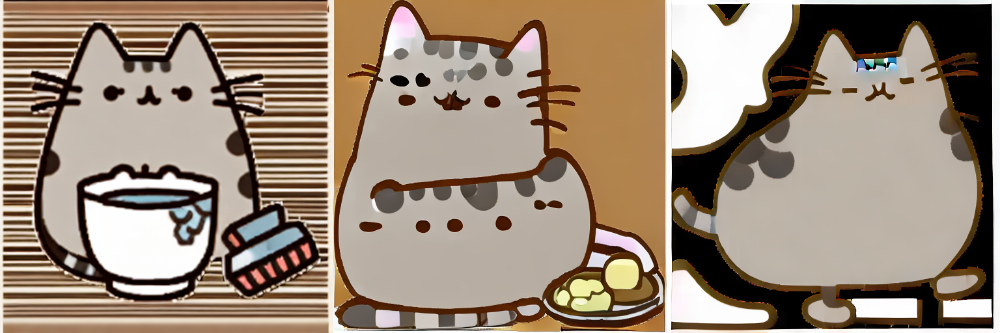

In [ ]:
params = params_default.copy()
params['prompt'] = 'Sticker of funny_cat Pusheen eating cookies and drinking milk.'
print('PROMPT:', params['prompt'], '\n')

make_image_grid([pipe(**params).images[0],
                 pipe_d1(**params).images[0],
                 pipe_d2(**params).images[0]], rows=1, cols=3)

### 2.2 Tiny VAE

In [ ]:
# https://huggingface.co/docs/diffusers/api/models/autoencoder_tiny

pipe = make_pipe()

pipe_tiny_vae = make_pipe()
pipe_tiny_vae.vae = AutoencoderTiny.from_pretrained("madebyollin/taesd", torch_dtype=torch_dtype)
pipe_tiny_vae = pipe_tiny_vae.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
/usr/local/lib/python3.11/dist-packages/peft/config.py:162: UserWarning: Unexpected keyword arguments ['corda_config'] for class LoraConfig, these are ignored. This probably means that you're loading a configuration file that was saved using a higher version of the library and additional parameters have been introduced since. It is highly recomme

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


config.json:   0%|          | 0.00/597 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/9.79M [00:00<?, ?B/s]

In [ ]:
type(pipe.vae), type(pipe_tiny_vae.vae)

(diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL,
 diffusers.models.autoencoders.autoencoder_tiny.AutoencoderTiny)

PROMPT: Sticker of funny_cat Pusheen wearing a red scarf. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

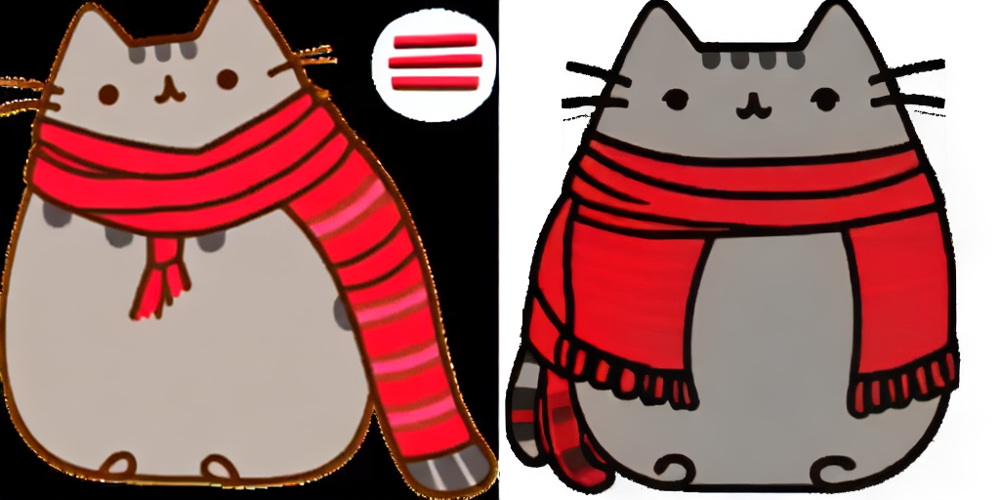

In [ ]:
print('PROMPT:', params_default['prompt'], '\n')

make_image_grid([pipe(**params_default).images[0],
                 pipe_tiny_vae(**params_default).images[0]], rows=1, cols=2)

PROMPT: Sticker of funny_cat Pusheen eating cookies and drinking milk. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

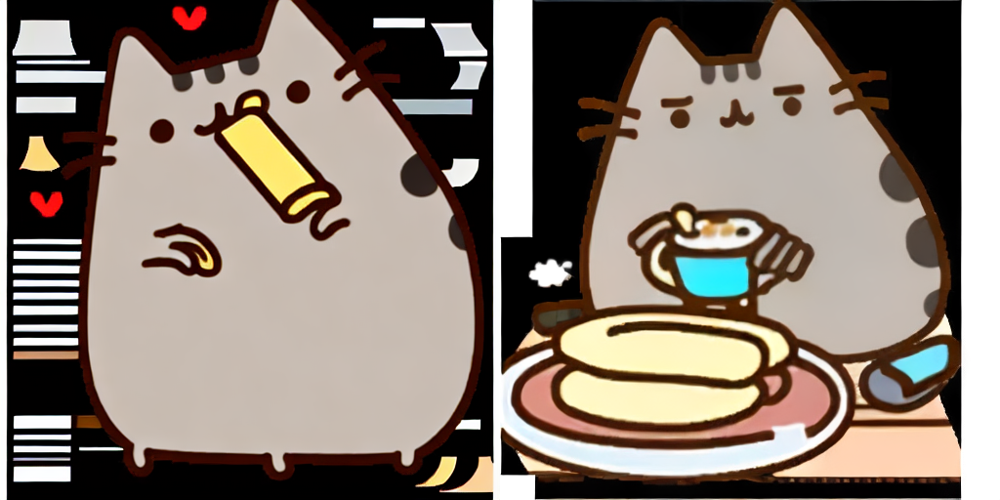

In [ ]:
params = params_default.copy()
params['prompt'] = 'Sticker of funny_cat Pusheen eating cookies and drinking milk.'
print('PROMPT:', params['prompt'], '\n')

make_image_grid([pipe(**params).images[0],
                 pipe_tiny_vae(**params).images[0]], rows=1, cols=2)

PROMPT: Sticker of funny_cat Pusheen eating pizza. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

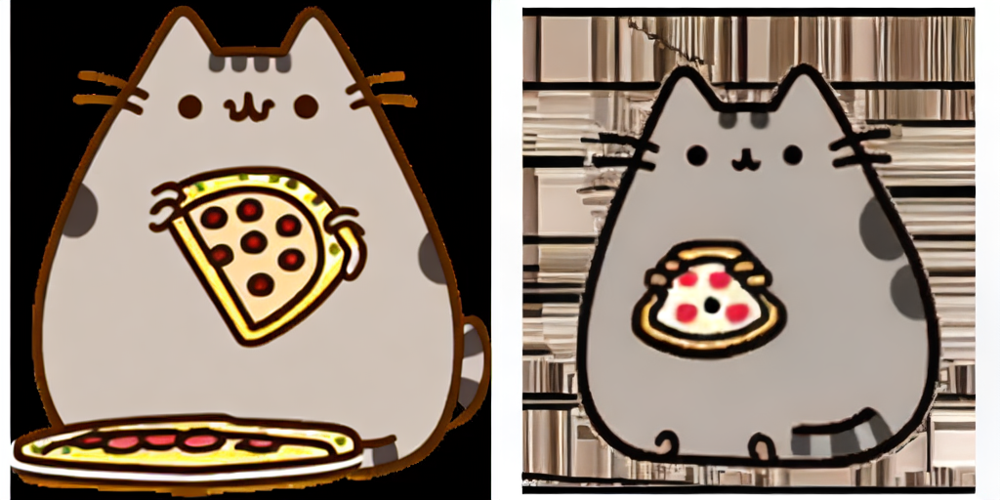

In [ ]:
params = params_default.copy()
params['prompt'] = 'Sticker of funny_cat Pusheen eating pizza.'
print('PROMPT:', params['prompt'], '\n')

make_image_grid([pipe(**params).images[0],
                 pipe_tiny_vae(**params).images[0]], rows=1, cols=2)

### 2.3 DDIMScheduler

In [ ]:
# https://huggingface.co/docs/diffusers/api/schedulers/ddim

pipe = make_pipe()

pipe_ddim = make_pipe()
pipe_ddim.scheduler = DDIMScheduler.from_config(pipe_ddim.scheduler.config)
pipe_ddim = pipe_ddim.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [ ]:
type(pipe.scheduler), type(pipe_ddim.scheduler)

(diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler)

PROMPT: Sticker of funny_cat Pusheen wearing a red scarf. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

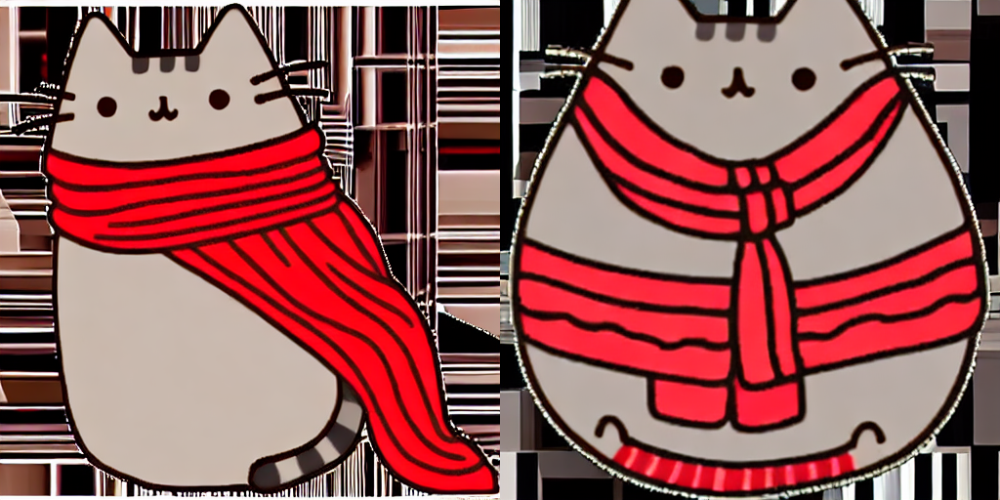

In [ ]:
print('PROMPT:', params_default['prompt'], '\n')

params_ddim = params_default.copy()
params_ddim['guidance_rescale'] = 0.7

make_image_grid([pipe(**params_default).images[0],
                 pipe_ddim(**params_ddim).images[0]], rows=1, cols=2)

PROMPT: Sticker of funny_cat Pusheen eating cookies and drinking milk. 



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

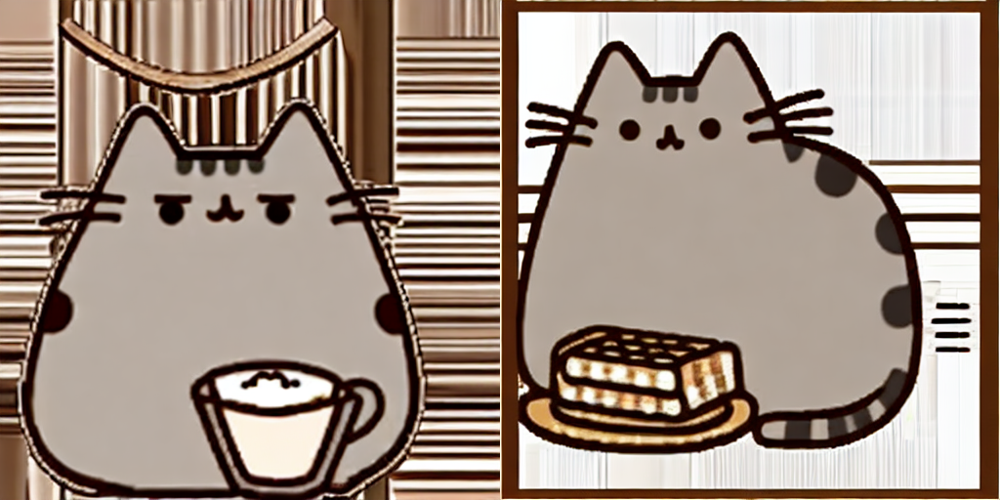

In [ ]:
params = params_default.copy()
params['prompt'] = 'Sticker of funny_cat Pusheen eating cookies and drinking milk.'
print('PROMPT:', params['prompt'], '\n')

params_ddim = params.copy()
params_ddim['guidance_rescale'] = 0.7

make_image_grid([pipe(**params).images[0],
                 pipe_ddim(**params_ddim).images[0]], rows=1, cols=2)

### 2.4 Сравниваем размер и скорость полученных моделей

In [ ]:
# Запустите несколько итераций инференса генерации стикеров для каждой из четырёх моделей. С помощью модуля time найдите среднее время инференса.
# Как соотносятся между собой время инференса и размер моделей? Почему? Сделайте выводы.

num_runs = 100
times = []
times_d1 = []
times_d2 = []
times_tiny_vae = []
times_ddim = []

pipe = make_pipe()
pipe.set_progress_bar_config(disable=True)
for _ in tqdm(range(num_runs), desc="SD 1.5"):
    start_time = time.time()
    _ = pipe(**params_default).images[0]
    end_time = time.time()
    times.append(end_time - start_time)
avg_time = sum(times) / num_runs
params_cnt = pipe_size(pipe)
print("\n\n***********  Базовая SD 1.5 ***********")
print(f"Mean inf time (n_iter={num_runs}, num_inf_steps=50): {avg_time:.2f} секунд")
print("*********** Параметры модели ***********")
print(f"Text Encoder: {params_cnt[1] / 1e6:.2f} M параметров")
print(f"UNet:         {params_cnt[0] / 1e6:.2f} M параметров")
print(f"VAE:          {params_cnt[2] / 1e6:.2f} M параметров")
print(f"Суммарно:     {sum(params_cnt)/1e6:.2f} M параметров")
print("\n\n")


# дистиллированная модель nota-ai/bk-sdm-v2-base
model_id = 'nota-ai/bk-sdm-v2-base'
pipe_d1 = make_pipe(model_id=model_id,
                    ckpt_dir='/content/drive/My Drive/Colab_Notebooks/Diffusion/model_output_distilled_base/')
pipe_d1.set_progress_bar_config(disable=True)
for _ in tqdm(range(num_runs), desc="Distilled base"):
    start_time = time.time()
    _ = pipe_d1(**params_default).images[0]
    end_time = time.time()
    times_d1.append(end_time - start_time)
avg_time = sum(times_d1) / num_runs
params_cnt = pipe_size(pipe_d1)
print("\n\n***********  Дистиллированная (base) ***********")
print(f"Mean inf time (n_iter={num_runs}, num_inf_steps=50): {avg_time:.2f} секунд")
print("*********** Параметры модели ***********")
print(f"Text Encoder: {params_cnt[1] / 1e6:.2f} M параметров")
print(f"UNet:         {params_cnt[0] / 1e6:.2f} M параметров")
print(f"VAE:          {params_cnt[2] / 1e6:.2f} M параметров")
print(f"Суммарно:     {sum(params_cnt)/1e6:.2f} M параметров")
print("\n\n")


# дистиллированная модель nota-ai/bk-sdm-v2-base
model_id = 'nota-ai/bk-sdm-v2-small'
pipe_d2 = make_pipe(model_id=model_id,
                    ckpt_dir='/content/drive/My Drive/Colab_Notebooks/Diffusion/model_output_distilled_small/')
pipe_d2.set_progress_bar_config(disable=True)
for _ in tqdm(range(num_runs), desc="Distilled small"):
    start_time = time.time()
    _ = pipe_d2(**params_default).images[0]
    end_time = time.time()
    times_d2.append(end_time - start_time)
avg_time = sum(times_d2) / num_runs
params_cnt = pipe_size(pipe_d2)
print("\n\n***********  Дистиллированная (small) ***********")
print(f"Mean inf time (n_iter={num_runs}, num_inf_steps=50): {avg_time:.2f} секунд")
print("*********** Параметры модели ***********")
print(f"Text Encoder: {params_cnt[1] / 1e6:.2f} M параметров")
print(f"UNet:         {params_cnt[0] / 1e6:.2f} M параметров")
print(f"VAE:          {params_cnt[2] / 1e6:.2f} M параметров")
print(f"Суммарно:     {sum(params_cnt)/1e6:.2f} M параметров")
print("\n\n")


pipe_tiny_vae = make_pipe()
pipe_tiny_vae.vae = AutoencoderTiny.from_pretrained("madebyollin/taesd", torch_dtype=torch_dtype)
pipe_tiny_vae.set_progress_bar_config(disable=True)
pipe_tiny_vae = pipe_tiny_vae.to(device)
for _ in tqdm(range(num_runs), desc="Tiny VAE"):
    start_time = time.time()
    _ = pipe_tiny_vae(**params_default).images[0]
    end_time = time.time()
    times_tiny_vae.append(end_time - start_time)
avg_time = sum(times_tiny_vae) / num_runs
params_cnt = pipe_size(pipe_tiny_vae)
print("\n\n***********  Tiny VAE ***********")
print(f"Mean inf time (n_iter={num_runs}, num_inf_steps=50): {avg_time:.2f} секунд")
print("*********** Параметры модели ***********")
print(f"Text Encoder: {params_cnt[1] / 1e6:.2f} M параметров")
print(f"UNet:         {params_cnt[0] / 1e6:.2f} M параметров")
print(f"VAE:          {params_cnt[2] / 1e6:.2f} M параметров")
print(f"Суммарно:     {sum(params_cnt)/1e6:.2f} M параметров")
print("\n\n")


pipe_ddim = make_pipe()
pipe_ddim.scheduler = DDIMScheduler.from_config(pipe_ddim.scheduler.config)
pipe_ddim.set_progress_bar_config(disable=True)
pipe_ddim = pipe_ddim.to(device)
for _ in tqdm(range(num_runs), desc="DDIM"):
    start_time = time.time()
    _ = pipe_ddim(**params_default).images[0]
    end_time = time.time()
    times_ddim.append(end_time - start_time)
avg_time = sum(times_ddim) / num_runs
params_cnt = pipe_size(pipe_ddim)
print("\n\n*********** DDIM ***********")
print(f"Mean inf time (n_iter={num_runs}, num_inf_steps=50): {avg_time:.2f} секунд")
print("*********** Параметры модели ***********")
print(f"Text Encoder: {params_cnt[1] / 1e6:.2f} M параметров")
print(f"UNet:         {params_cnt[0] / 1e6:.2f} M параметров")
print(f"VAE:          {params_cnt[2] / 1e6:.2f} M параметров")
print(f"Суммарно:     {sum(params_cnt)/1e6:.2f} M параметров")
print("\n\n")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
/usr/local/lib/python3.11/dist-packages/peft/config.py:162: UserWarning: Unexpected keyword arguments ['corda_config'] for class LoraConfig, these are ignored. This probably means that you're loading a configuration file that was saved using a higher version of the library and additional parameters have been introduced since. It is highly recomme



***********  Базовая SD 1.5 ***********
Mean inf time (n_iter=100, num_inf_steps=50): 2.85 секунд
*********** Параметры модели ***********
Text Encoder: 123.36 M параметров
UNet:         861.12 M параметров
VAE:          83.65 M параметров
Суммарно:     1068.12 M параметров





Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/peft/config.py:162: UserWarning: Unexpected keyword arguments ['corda_config', 'trainable_token_indices'] for class LoraConfig, these are ignored. This probably means that you're loading a configuration file that was saved using a higher version of the library and additional parameters have been introduced since. It is highly recommended to upgrade the PEFT version before continuing (e.g. by running `pip install -U peft`).
  warnings.warn(
Distilled base: 100%|██████████| 100/100 [03:06<00:00,  1.86s/it]



***********  Дистиллированная (base) ***********
Mean inf time (n_iter=100, num_inf_steps=50): 1.86 секунд
*********** Параметры модели ***********
Text Encoder: 341.14 M параметров
UNet:         584.54 M параметров
VAE:          83.65 M параметров
Суммарно:     1009.34 M параметров





Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Distilled small: 100%|██████████| 100/100 [02:45<00:00,  1.65s/it]



***********  Дистиллированная (small) ***********
Mean inf time (n_iter=100, num_inf_steps=50): 1.65 секунд
*********** Параметры модели ***********
Text Encoder: 341.14 M параметров
UNet:         486.69 M параметров
VAE:          83.65 M параметров
Суммарно:     911.48 M параметров





Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
Tiny VAE: 100%|██████████| 100/100 [04:44<00:00,  2.85s/it]




***********  Tiny VAE ***********
Mean inf time (n_iter=100, num_inf_steps=50): 2.85 секунд
*********** Параметры модели ***********
Text Encoder: 123.36 M параметров
UNet:         861.12 M параметров
VAE:          2.45 M параметров
Суммарно:     986.92 M параметров





Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
DDIM: 100%|██████████| 100/100 [04:41<00:00,  2.82s/it]



*********** DDIM ***********
Mean inf time (n_iter=100, num_inf_steps=50): 2.81 секунд
*********** Параметры модели ***********
Text Encoder: 123.36 M параметров
UNet:         861.12 M параметров
VAE:          83.65 M параметров
Суммарно:     1068.12 M параметров





### 2.5 Выводы

* Картинки, которые генерировали **дистиллированные** модели с LoRA адаптерами, по качеству были сильно хуже, чем базовая SD 1.5 или другие ускоренные варианты модели. У small варианта дистиллированной модели самое маленькое число параметров и самый быстрый инференс. Возможно, если попробовать иначе обучить LoRA адаптеры или дать модели на вход бОльший семпл для обучения, ситуация будет чуть лучше.
* SD 1.5 c **tiny VAE**, на мой взгляд, показала отличные, сравнимые с базовой SD 1.5, результаты по качеству генерируемых картинок. Кол-во параметров у модели уменьшилось на 81 М. Тем не менее, среднее время инференса не изменилось и осталось самым большим из рассмотренных вариантов.
* Изменение scheduler'а со стандартного на **DDIM** позволило сократить время инференса на 0.04 сек и не потерять при этом в качестве генерируемых картинок.
